In [57]:
import yaml
import string
import gensim
import os
from tqdm import tqdm
import numpy as np
import time

In [2]:
dataFolder = './dataFolder/2018'

In [3]:
def read_corpus(fname, tokenize = True, tokens_only=False, minWords = 100):
    with open(fname) as f:
        s = yaml.load(f)
        txt = s['Text']
        if tokenize:
            words = gensim.utils.simple_preprocess(txt, min_len=1)
        else:
            words = txt
            
        if len(words) < minWords:
            print('TOO SHORT: ' + fname + ' (%i words < min %i)'%(len(words), minWords))
            return None
            
        if tokens_only:
            return words
        else:
            #tags = [s[k].strip() for k in ['Title', 'SetInCountry', 'AuthorCountry', 'Category']]
            tags = [fname]
            return gensim.models.doc2vec.TaggedDocument(words, tags)

In [4]:
docs = [f.name for f in os.scandir(dataFolder) if f.is_file()]
docs.sort()

N = len(docs)
k = int(N*.75)

train_docs = docs[0:N]
#test_docs  = docs[k:N]

In [5]:
train_corpus = [read_corpus(os.path.join(dataFolder, fname)) for fname in train_docs]

titles = [doc.tags[0] for doc in train_corpus]

#test_corpus  = [read_corpus(os.path.join(dataFolder, fname), tokens_only=True) for fname in test_docs]

In [144]:
#TODO : check if parameters make sense ?
#Careful: dm_concat might not be good to use?
# model = Doc2Vec(dm=1, dm_concat=1, size=100, window=5, negative=0, hs=1, min_count=2, workers=cores)
#iter = 1?

model = gensim.models.doc2vec.Doc2Vec(vector_size=100, min_count=0)

In [145]:
model.build_vocab(train_corpus)

In [146]:
for e in tqdm(range(5)):
    model.train(train_corpus, total_examples=model.corpus_count, epochs=10)
    

100%|██████████| 5/5 [02:51<00:00, 35.15s/it]


In [147]:
model.save('./gensimModel_%s.m'%time.strftime("%Y%m%d-%H%M%S"))

In [180]:
list(idx) + [3]

[5956, 0, 1366, 3]

In [47]:
compareTexts = {}
D = []
for title in tqdm(titles):
    distances = model.docvecs.distances(title)
    D += [distances]
    idx = np.argsort(distances)
    compareTexts[title] = {'m': (idx[1],  titles[idx[1]],  1-distances[idx[1]]), 
                           'M': (idx[-1], titles[idx[-1]], 1-distances[idx[-1]])}

100%|██████████| 6517/6517 [00:17<00:00, 379.09it/s]


In [116]:
#title = titles[584]

# iidx = titles.index(os.path.join(dataFolder, 'the-first-tahksnahky'))
# iidx = titles.index(os.path.join(dataFolder, 'stand-up'))
# iidx = titles.index(os.path.join(dataFolder, 'memories-of-eden'))
# iidx = titles.index(os.path.join(dataFolder, 'the-first-hitchhike'))

iidx = titles.index(os.path.join(dataFolder, 'abre-le-boca')) #interesting one

iidx = titles.index(os.path.join(dataFolder, 'a-girl-exploring-her-limits'))

title = titles[iidx]


ttl = title.split('/')[-1]
print('For ' + ttl + ': \n')
origTxt = read_corpus(title, tokens_only=True, tokenize=False)
print(origTxt)
print('###################')

for lbl, m in [('Most', 'm') , ('Least' , 'M')]:
    idx, otherTitle , s = compareTexts[title][m]
    otherText = read_corpus(otherTitle, tokens_only=True, tokenize=False)
    print('%s Similar is (%i) %s (%.2f)'%(lbl, idx, otherTitle.split('/')[-1], s))
    print(otherText)
    print('###################')
    

For a-girl-exploring-her-limits: 

Since child I have been the one to always be scared of heights, adventure and being in a group all that due to my size. I have always been over weight. I tried so many diets and exercise classes but getting to 18 make me realise that’s not the life I wanted. I’m from Mauritius and the island is full of hidden gems, so I decided to start a different lifestyle, I pushed myself to the limit, i change my group of friends, i started going out more to places, i discover hiking and how it’s breath taking when you reach the summit of a mountain, Mauritius is full of mountains, sea and waterfalls, so I made myself an objectives to at least go explore a mountain or waterfall once a month. Mauritius-explore is a social media group that allow you to be part of a community, saying this it means that you can book trips with locals to go to places or even share your experience with locals and tourists. There’s so many more groups. Some focus on healthy walks and hik

In [ ]:
# for doc in docs:
#     doc_vecs = model.infer_vector(doc.split())
# # creating a matrix from list of vectors
# mat = np.stack(doc_vecs)

# # Clustering Kmeans
# km_model = KMeans(n_clusters=5)
# km_model.fit(mat)
# # Get cluster assignment labels
# labels = km_model.labels_

# # Clustering DBScan
# dbscan_model = DBSCAN()
# labels = dbscan_model.fit_predict(mat)  


#DBSCAN or HDBSCAN ?
# https://hdbscan.readthedocs.io/en/latest/comparing_clustering_algorithms.html#dbscan

In [16]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(D) #define the linkage_matrix using ward clustering pre-computed distances

KeyboardInterrupt: 

In [ ]:
linkage_matrix.shape

/usr/local/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning:


Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.



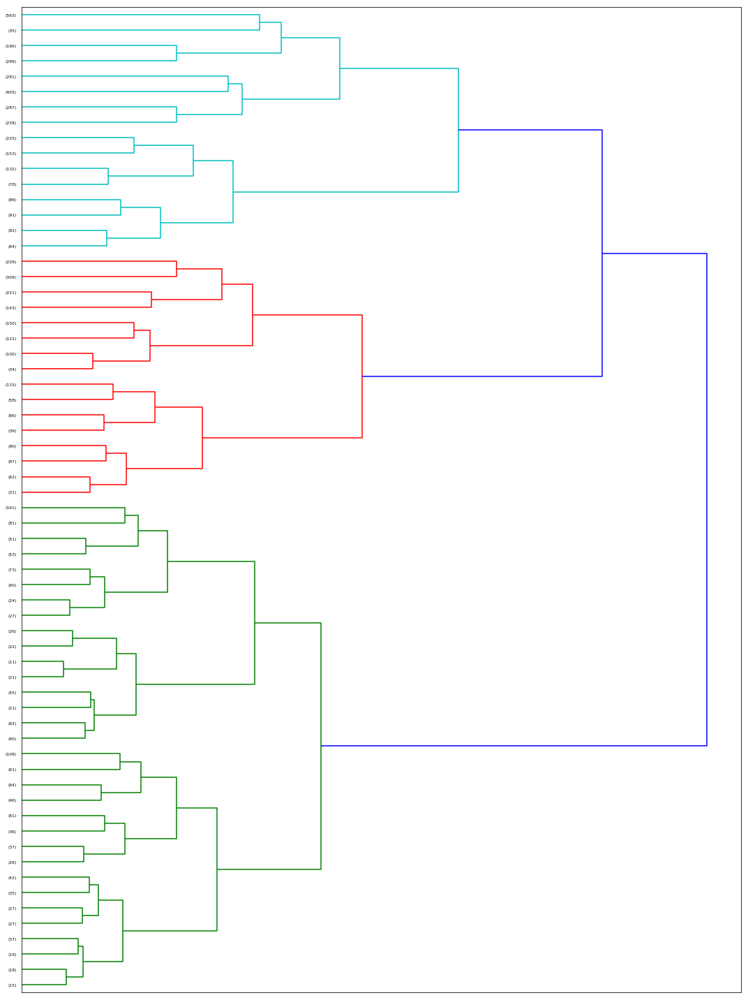

In [159]:
fig, ax = plt.subplots(figsize=(15, 20)) # set size
ax = dendrogram(linkage_matrix, p = 5, truncate_mode='level',  orientation="right", labels=titles);

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters2.png', dpi=200) #save figure as ward_clusters

In [141]:
import plotly.plotly as py
import plotly.figure_factory as ff

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)


In [148]:
labels = [t.split('/')[-1] for t in titles]

In [155]:
linkage_matrix[0:10,]

array([[3.74200000e+03, 3.74300000e+03, 8.55459622e-01, 2.00000000e+00],
       [3.73700000e+03, 3.73800000e+03, 8.65582864e-01, 2.00000000e+00],
       [1.99400000e+03, 1.99500000e+03, 8.69353482e-01, 2.00000000e+00],
       [3.07300000e+03, 3.07400000e+03, 8.86621151e-01, 2.00000000e+00],
       [3.73900000e+03, 3.74000000e+03, 8.89677124e-01, 2.00000000e+00],
       [4.28600000e+03, 4.28700000e+03, 8.97125018e-01, 2.00000000e+00],
       [2.83000000e+03, 2.83100000e+03, 9.26599623e-01, 2.00000000e+00],
       [1.25000000e+03, 1.25100000e+03, 9.41067417e-01, 2.00000000e+00],
       [4.48200000e+03, 4.48300000e+03, 9.67426638e-01, 2.00000000e+00],
       [3.74100000e+03, 6.51700000e+03, 9.69225323e-01, 3.00000000e+00]])

In [160]:
X = np.random.rand(10, 10)
fig = ff.create_dendrogram(X, orientation='left', labels = labels,
                           distfun=lambda x: x, linkagefun=lambda x: linkage_matrix)
fig['layout'].update({'width':1000, 'height':800, 'yaxis':{'tickangle':45}})
iplot(fig)